# Imports

In [7]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
from utils.data_loader import load_parquet
from sklearn.model_selection import TimeSeriesSplit, BaseCrossValidator
import numpy as np
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
# from sklearn.linear_model import MultiTaskElasticNetCV

from warnings import simplefilter

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import r2_score

# 1. Load Data

In [8]:
# Load only specific columns needed for analysis
columns_needed = ['time', 'orbital_decay', '|avg B|', 'F10.7 (LASP)', 'Kp (LASP)', 'Temperature (K)', 'Flow Speed (km/s', 'Bz GSE']

GFOC_data = load_parquet(columns=columns_needed)
GFOC_data.head()

✅ Successfully loaded data with shape: (3157920, 8)


,time,orbital_decay,|avg B|,F10.7 (LASP),Kp (LASP),Temperature (K),Flow Speed (km/s,Bz GSE
0,2023-01-01 00:00:00,16.6730,5.630000,153.0,2.333,80634.0,595.600000,-0.960000
1,2023-01-01 00:00:20,16.6730,5.633333,153.0,2.333,80634.0,595.600000,-0.426667
2,2023-01-01 00:00:40,16.6735,5.636667,153.0,2.333,80634.0,595.600000,0.106667
3,2023-01-01 00:01:00,16.6740,5.640000,153.0,2.333,80634.0,595.600000,0.640000
4,2023-01-01 00:01:20,16.6740,5.633333,153.0,2.333,82111.0,593.066667,0.190000


## 1.1 Func Utils

In [9]:
geomagnetic_storm_levels = {
    "G0 (Quiet to Unsettled)": (0.0, 4.99999),
    "G1 (Minor)": (5.0, 5.99999),
    "G2 (Moderate)": (6.0, 6.99999),
    "G3 (Strong)": (7.0, 7.99999),
    "G4 (Severe)": (8.0, 8.999999),
    "G5 (Extreme)": (9.0, 9.99999)
}

def annotate_geomagnetic_storm_events(df):
    for i, level in enumerate(geomagnetic_storm_levels.keys()):
        if 'G0' in level:
            continue

        activity = df['activity_level'].values
        is_level = activity == level
        regions = np.flatnonzero(np.diff(np.concatenate(([0], is_level.view(np.int8), [0]))))
        event_count = len(regions) // 2
        data_samples_per_region = [regions[i + 1] - regions[i] for i in range(0, len(regions), 2)]
        df.loc[df['activity_level'] == level, 'event_number'] = np.repeat(np.arange(1, event_count + 1),
                                                                          data_samples_per_region)
        df.loc[df['activity_level'] == level, 'unique_event_id'] = [int(f'{i}{n}') for n in
                                                                    np.repeat(np.arange(1, event_count + 1),
                                                                              data_samples_per_region)]

    return df

def set_activity_level(df):
    df['activity_level'] = df['Kp (LASP)'].apply(lambda kp: next((level for level, (low, high) in geomagnetic_storm_levels.items() if low <= kp <= high), 'Unknown'))

    # propagate backward the strongest activity levels until the transition to quiet level to the left and right 
    # e.g. G0 G3 G2 G5 G0 -> G0 G5 G5 G5 G0
    activity = df['activity_level'].values
    for level in ["G5 (Extreme)", "G4 (Severe)", "G3 (Strong)", "G2 (Moderate)", "G1 (Minor)"]:
        is_not_quiet = activity != 'G0 (Quiet to Unsettled)'
        is_level = activity == level
        regions = np.flatnonzero(np.diff(np.concatenate(([0], is_not_quiet.view(np.int8), [0]))))
        for start, end in zip(regions[::2], regions[1::2]):
            if is_level[start:end].any():
                activity[start:end] = level
    df['activity_level'] = activity

    N = 4 * 60 * 3 
    activity = df['activity_level'].values
    regions = np.flatnonzero(np.diff(np.concatenate(([0], activity != activity[0],
        [0]))))
    for start, end in zip(regions[::2], regions[1::2]):
        if end - start < N:
            left_level = activity[start - 1] if start > 0 else None
            right_level = activity[end] if end < len(activity) else None
            if left_level == right_level and left_level is not None and left_level != 'G0 (Quiet to Unsettled)':
                activity[start:end] = left_level
    df['activity_level'] = activity

    df = annotate_geomagnetic_storm_events(df)
    df['decay_level'] = df['orbital_decay'].rank(pct=True)
    return df

def annotate_geomag_events_plus_minus_24h(df):
    df['after_event_24h'] = False
    df['before_event_24h'] = False
    df['during_event'] = False
    df['event_window_plus_minus_24h'] = False

    for unique_event in df['unique_event_id'].dropna().unique():
        event_times = df.loc[df['unique_event_id'] == unique_event].index
        
        if len(event_times) == 0:
            continue

        event_start = event_times[0]
        event_end = event_times[-1]
        # print(f"Annotating event: {unique_event} from {event_start} to {event_end}")

        time_24h_before = event_start - pd.Timedelta(hours=24)
        time_24_hours_after = event_end + pd.Timedelta(hours=24)

        df.loc[(df.index >= time_24h_before) & (df.index < event_start), 'before_event_24h'] = True
        df.loc[(df.index >= event_end) & (df.index <= time_24_hours_after), 'after_event_24h'] = True
        df.loc[(df.index >= event_start) & (df.index <= event_end), 'during_event'] = True
        df.loc[(df.index >= time_24h_before) & (df.index <= time_24_hours_after), 'event_window_plus_minus_24h'] = True

    return df

In [ ]:
simplefilter("ignore")

# Set Matplotlib defaults
plt.style.use("default")
plt.rc("figure", autolayout=True, figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)
%config InlineBackend.figure_format = 'retina'

def plot_multistep(y, every=1, ax=None, palette_kwargs=None):
    palette_kwargs_ = dict(palette='husl', n_colors=16, desat=None)
    if palette_kwargs is not None:
        palette_kwargs_.update(palette_kwargs)
    palette = sns.color_palette(**palette_kwargs_)
    if ax is None:
        fig, ax = plt.subplots()
    ax.set_prop_cycle(plt.cycler('color', palette))
    for date, preds in y[::every].iterrows():
        preds.index = pd.period_range(start=date, periods=len(preds), freq='60S')
        preds.plot(ax=ax, alpha=0.5)
    return ax

def plot_results(y_train, y_fit, y_test, y_pred):
    # skip each m steps for more efficient plotting
    m = 10
    y_train = y_train[::m]
    y_fit = y_fit[::m]
    y_test = y_test[::m]
    y_pred = y_pred[::m]


    palette = dict(palette='husl', n_colors=64)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(11, 6))
    ax1 = y_train.iloc[:,[0]].plot(**plot_params, ax=ax1)
    ax1 = plot_multistep(y_fit, every=60, ax=ax1, palette_kwargs=palette)
    _ = ax1.legend(['Orbital Decay (train)', 'Forecast'])
    ax1.grid(True)

    # plot complete forecast horizon
    temp = y_test.iloc[:,[-1]].copy()
    temp.index = temp.index + pd.Timedelta(hours=n)  #! may need to manualy need to set timedelta here !!!!!!
    temp2 = y_test.iloc[:,[0]].copy()
    temp.columns = temp2.columns
    y_temp = pd.concat([temp2, temp])
    ax2 = y_temp.plot(**plot_params, ax=ax2)
    ax2 = plot_multistep(y_pred, every=60, ax=ax2, palette_kwargs=palette)
    _ = ax2.legend(['Orbital Decay (test)', 'Forecast'])
    # ax2.vlines('2024-05-10 16:37:00', ymin = 0, ymax = 140, color='red', linestyle='--')
    ax2.grid(True)
    plt.tight_layout()
    plt.show()

def statistics(y_train, y_fit, y_test, y_pred):
    train_rmse = root_mean_squared_error(y_train, y_fit)
    test_rmse = root_mean_squared_error(y_test, y_pred)
    print((f"Train RMSE: {train_rmse:.3}\n" f"Test RMSE: {test_rmse:.3}"))
    train_r2 = r2_score(y_train, y_fit)
    test_r2 = r2_score(y_test, y_pred)
    print((f"Train R2: {train_r2:.3}\n" f"Test R2: {test_r2:.3}"))

    train_rmse_list = []
    test_rmse_list = []
    train_r2_list = []
    test_r2_list = []

    for i in range(len(y_train.columns)):
        train_rmse_list.append(root_mean_squared_error(y_train.iloc[:, i], y_fit.iloc[:, i]))
        test_rmse_list.append(root_mean_squared_error(y_test.iloc[:, i], y_pred.iloc[:, i]))
        train_r2_list.append(r2_score(y_train.iloc[:, i], y_fit.iloc[:, i]))
        test_r2_list.append(r2_score(y_test.iloc[:, i], y_pred.iloc[:, i]))
    fix, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
    ax[0].plot(train_rmse_list, label='Train RMSE')
    ax[0].plot(test_rmse_list, label='Test RMSE')
    ax[0].set_ylabel('RMSE')
    ax[0].legend()
    ax[0].grid(True)

    ax[1].plot(train_r2_list, label='Train R2')
    ax[1].plot(test_r2_list, label='Test R2')
    ax[1].set_ylabel('R2 Score')
    ax[1].set_xlabel('Forecast Step (20s intervals)')
    ax[1].legend()
    ax[1].grid(True)
    plt.tight_layout()
    plt.show()


In [55]:
def make_lags(df, lag_config, lead_time=1):
    out = {}

    for col, params in lag_config.items():
        n_lags = params.get('lags', 1)

        for i in n_lags:
            out[f"{col}_lag_{i}"] = df[col].shift(i)

    return pd.DataFrame(out)


def make_multistep_target(ts, steps):
    return pd.concat(
        {f'y_step_{i + 1}': ts.shift(-i)
         for i in range(steps)},
        axis=1)

def compute_prediction_bands(y_test, y_pred):
    T, N = y_test.shape

    band_min = np.full(T, np.nan)
    band_max = np.full(T, np.nan)
    band_mean = np.full(T, np.nan)
    band_sem = np.full(T, np.nan)

    for t in range(T):
        start = max(0, t - N)
        end = t
        preds = []
        for s in range(start, end):
            horizon = t - s - 1  
            preds.append(y_pred.iloc[s, horizon])
        if preds:
            preds = np.array(preds)
            sem = preds.std(ddof=1) / np.sqrt(len(preds))
            band_min[t] = np.percentile(preds, 5)
            band_max[t] = np.percentile(preds, 95)
            band_mean[t] = preds.mean()
            band_sem[t] = sem

    return band_min, band_max, band_mean, band_sem

## 1.2 Select a subset

In [10]:
from utils.plot_loader import create_subset
# =========================== Input ===================================
start_date = '2023-01-01 00:00:00'
end_date = '2024-12-31 00:00:00'
# =====================================================================

subset = create_subset(GFOC_data, start_date, end_date, resample_rate='20s')
subset = set_activity_level(subset)
subset = annotate_geomag_events_plus_minus_24h(subset)
print(subset['event_window_plus_minus_24h'].value_counts())

dt_seconds = (subset.index[1] - subset.index[0]).total_seconds()

event_window_plus_minus_24h
False    2565594
True      588007
Name: count, dtype: int64


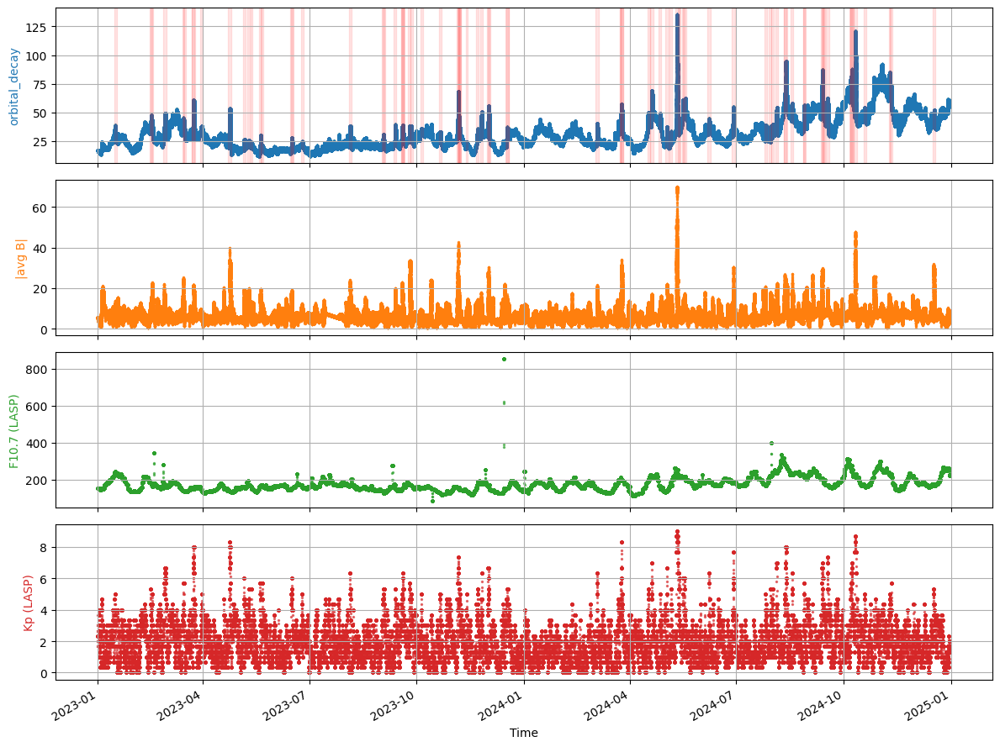

In [11]:
fig, axes = plt.subplots(4, 1, figsize=(12, 9), sharex=True)

axes[0].scatter(subset.index, subset['orbital_decay'], s=2, c='C0', alpha=0.6)
axes[0].set_ylabel('orbital_decay', color='C0')
axes[0].grid(True)

axes[1].scatter(subset.index, subset['|avg B|'], s=2, c='C1', alpha=0.6)
axes[1].set_ylabel('|avg B|', color='C1')
axes[1].grid(True)

axes[2].scatter(subset.index, subset['F10.7 (LASP)'], s=2, c='C2', alpha=0.6)
axes[2].set_ylabel('F10.7 (LASP)', color='C2')
axes[2].set_xlabel('Time')
axes[2].grid(True)

axes[3].scatter(subset.index, subset['Kp (LASP)'], s=2, c='C3', alpha=0.6)
axes[3].set_ylabel('Kp (LASP)', color='C3')
axes[3].set_xlabel('Time')
axes[3].grid(True)

event_ids = subset['unique_event_id'].dropna().unique()
for event_id in event_ids:
    event_data = subset[subset['unique_event_id'] == event_id]
    start_time = event_data.index[0]
    end_time = event_data.index[-1]
    axes[0].axvspan(start_time - pd.Timedelta(hours=24), end_time + pd.Timedelta(hours=24), color='red', alpha=0.1)

fig.autofmt_xdate()
plt.tight_layout()
plt.show()

# 2. Prepare Data

## 2.1 Add harmonics

In [12]:
from numpy.polynomial import Polynomial

p_list = [1.06605722e+02, -7.21846851e-09]
p = Polynomial(p_list)

orbital_period = p(subset.index.astype(np.int64) / 1e9) * 60 # seconds

# cumulative orbital cycles over time
cycles = np.cumsum(1 / orbital_period) * dt_seconds   # because your sampling is every 20s

# phase angle
subset["phase"] = (2 * np.pi * cycles) % (2 * np.pi)

# add more harmonics to potentialy capture other periodicities; if not useful the lasso should zero them out
num_harmonics = 4
for n in range(1, num_harmonics + 1):
    subset[f'sin_harmonic_{n}'] = np.sin(n * subset["phase"])
    subset[f'cos_harmonic_{n}'] = np.cos(n * subset["phase"])

## 2.2 Add median decay information that will go as input - this is not biased
Introduced because there is a 12 m/day difference in median decays between current train/test

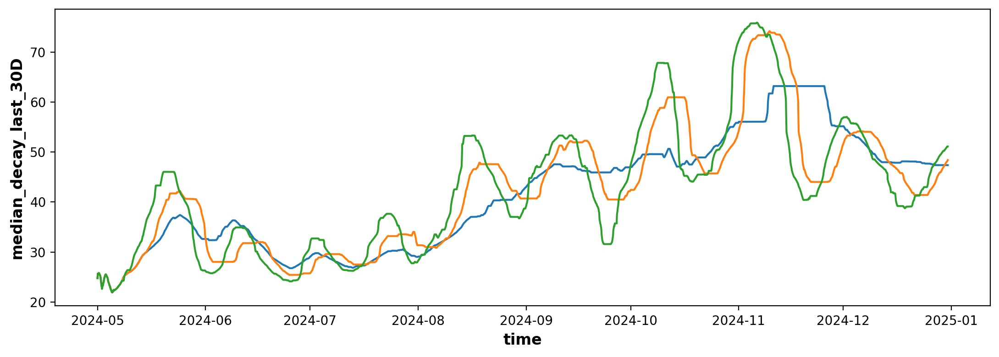

In [ ]:
subset['median_decay_last_7D'] = subset['orbital_decay'].rolling(window=int(7*24*60*(60//dt_seconds)), min_periods=1).median()
subset['median_decay_last_14D'] = subset['orbital_decay'].rolling(window=int(14*24*60*(60//dt_seconds)), min_periods=1).median()
subset['median_decay_last_30D'] = subset['orbital_decay'].rolling(window=int(30*24*60*(60//dt_seconds)), min_periods=1).median()
sns.lineplot(data=subset, x=subset.index, y='median_decay_last_30D')
sns.lineplot(data=subset, x=subset.index, y='median_decay_last_14D')
sns.lineplot(data=subset, x=subset.index, y='median_decay_last_7D')
plt.show()

## 1.3 Configure lags and forecast horizon

In [112]:
hour = int(60 // (dt_seconds / 60))  # number of samples in one hour
lag_config_trend = {
    # removed having target data as feature to avoid data leakage given the target signal is spread out
    # "orbital_decay": {"lags": list(range(1*hour, 24*hour, 3*hour))}, 
    "|avg B|": {'lags': list(range(1, 3*hour, hour//10)) + list(range(3*hour, 50*hour, hour//2))},
    "Bz GSE": {'lags': list(range(1, 3*hour, hour//10)) + list(range(3*hour, 50*hour, hour//2))},
    "Temperature (K)": {'lags': list(range(1, 3*hour, hour//10)) + list(range(3*hour, 50*hour, hour//2))},
    "Flow Speed (km/s": {'lags': list(range(1, 3*hour, hour//10)) + list(range(3*hour, 50*hour, hour//2))},
    "F10.7 (LASP)": {'lags': list(range(1, 24*hour, 6*hour)) + list(range(24*hour, 50*hour, 12*hour))},
    "median_decay_last_7D": {'lags': list(range(1, 50*hour, 12*hour))},
    "median_decay_last_14D": {'lags': list(range(1, 50*hour, 12*hour))},
    "median_decay_last_30D": {'lags': list(range(1, 50*hour, 12*hour))}
}

subset = subset[subset.index >= '2024-05-01 00:00:00'].copy()
event_subset = subset[subset['event_window_plus_minus_24h']]

target = 'orbital_decay'
n = 12 # forecast horizon in hours
target_step = 15 # forecast every 15 minutes

# 1.3 Prepare dataset

In [113]:
X = make_lags(subset, lag_config_trend)
y = make_multistep_target(subset[[target]].copy(), steps=int(n * 60 * (60 // dt_seconds)))
y = y.iloc[:, :: int(target_step * (60 // dt_seconds))] # every 30 min step

# Shifting has created indexes that don't match. Only keep times for
na_mask = X.isna().any(axis=1) | y.isna().any(axis=1)
X = X[~na_mask]
y = y[~na_mask]

# Rename columns to avoid MultiIndex issues
X.columns = ['_'.join(map(str, col)) if isinstance(col, tuple) else str(col) for col in X.columns]

In [114]:
mask = y.index.isin(event_subset.index)

# Save raw data before filtering, for further inferences later
X_raw = X.copy()
y_raw = y.copy()

X = X[mask]
y = y[mask]

# Train-test split (chronologically)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, shuffle=False)

In [ ]:
# compute median deay during train vs test; if very different may indicate distribution shift that needs to be addressed
median_decay_train = y_train.median().mean()
median_decay_test = y_test.median().mean()
print(f"Median Decay Train: {median_decay_train:.3f}, Median Decay Test: {median_decay_test:.3f}")

Median Decay Train: 38.871, Median Decay Test: 51.514


# 3. Predict Decay

## 3.1 Fit model


In [116]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model_trend = Lasso(alpha=0.3)
model_trend.fit(X_train_scaled, y_train)

y_fit = pd.DataFrame(model_trend.predict(X_train_scaled), index=X_train.index, columns=y_train.columns)
y_pred = pd.DataFrame(model_trend.predict(X_test_scaled), index=X_test.index, columns=y_test.columns)

## 3.2 Check coefficients

In [117]:
coef_df = pd.DataFrame({
    'feature': X_train.columns,
    'coefficient': model_trend.coef_[1, :]
})
coef_df = coef_df.sort_values(by='coefficient', key=abs, ascending=False)
coef_df['lag_hours'] = coef_df['feature'].apply(lambda x: f"{int(x.split('_')[-1]) * (dt_seconds / 3600):.2f}" if 'lag' in x else np.nan)
coef_df.head(10)

,feature,coefficient,lag_hours
503,median_decay_last_7D_lag_1,7.366701,0.01
512,median_decay_last_14D_lag_8641,-4.053650,48.01
502,F10.7 (LASP)_lag_8640,1.865395,48.00
501,F10.7 (LASP)_lag_6480,1.836425,36.00
0,|avg B|_lag_1,1.294581,0.01
495,Flow Speed (km/s_lag_8910,1.166281,49.50
31,|avg B|_lag_630,0.687372,3.50
516,median_decay_last_30D_lag_6481,0.663953,36.01
513,median_decay_last_30D_lag_1,0.583195,0.01
33,|avg B|_lag_810,0.574587,4.50


# 4. Analysis

## 4.1 Analyze individual sample predictions in the test set

In [118]:
test_subset = subset.loc[y_test.index]
event_ids = test_subset['unique_event_id'].dropna().unique()
event_peak_times = []
for event_id in event_ids:
    event_data = test_subset[test_subset['unique_event_id'] == event_id]
    peak_time = event_data.index[len(event_data) // 2]
    event_peak_times.append(peak_time)

In [214]:
def plot_forecast_for_event(event_id, event_peak_time, time_delta_hours=1):
    time_idx = event_peak_time - pd.Timedelta(hours=time_delta_hours)
    idx = y_test.index.get_loc(time_idx)

    # Extract sample
    sample_test = X_test.iloc[idx]
    sample_test_F = sample_test.filter(like='F10.7')
    sample_test_B = sample_test.filter(like='|avg B|')
    sample_test_y = y_test.iloc[idx]

    # Compute lag times
    lag_times_F = [-int(col.split('_')[-1]) * dt_seconds / 60 for col in sample_test_F.index]
    lag_times_B = [-int(col.split('_')[-1]) * dt_seconds / 60 for col in sample_test_B.index]
    lag_times_y = [int(col.split('_')[-1]) * dt_seconds / 60 for col in map(lambda x: x[0], sample_test_y.index)]

    sample_test_F.index = lag_times_F
    sample_test_B.index = lag_times_B

    # Define time window for decay plotting
    time_window = (time_idx - pd.Timedelta(hours=24), time_idx + pd.Timedelta(hours=24))
    true_decay = subset.loc[time_window[0]:time_window[1], target]
    pred_trend = y_pred.iloc[idx]
    bz_window = subset.loc[time_window[0]:time_window[1], '|avg B|']

    fig, ax = plt.subplots(figsize=(10, 6), nrows=2)
    ax = ax.flatten()

    # Plot lagged features
    ax[0].scatter(sample_test_F.index, sample_test_F.values, color='blue')
    ax2 = ax[0].twinx()
    ax2.scatter(sample_test_B.index, sample_test_B.values, color='orange', alpha=0.7)

    ax[0].set_title(f'Input lags for F10.7 and |avg B| for event id {event_id}\n{y_test.iloc[idx].name}')
    ax[0].set_xlabel('Lagged Features')
    ax[0].set_ylabel('F10.7 Value', color='blue')
    ax2.set_ylabel('|avg B| Value', color='orange')
    ax[0].grid(True)

    xticks = ax[0].get_xticks()
    ax[0].set_xticklabels([f'{int(t/60)}h' for t in xticks])

    # Plot decay trends
    ax[1].plot(true_decay.index, true_decay.values, label='True Decay', color='black')
    pred_times = [time_idx + pd.Timedelta(minutes=10 * (i + 1)) for i in range(len(pred_trend))]
    ax[1].plot(pred_times, pred_trend.values, marker='o', linestyle='None', color='red', label='Predicted Decay')

    ax[1].set_title('Predicted Decay vs. True Decay')
    ax[1].set_xlabel('Time')
    ax[1].set_ylabel('Decay Rate (m/day)')
    ax[1].legend()
    ax[1].grid(True)

    # Overlay |avg B| on second plot
    ax2 = ax[1].twinx()
    ax2.scatter(x=bz_window.index, y=bz_window.values, color='blue', alpha=0.8, s=1)
    ax2.set_ylabel('|avg B|', color='blue')

    # Mark forecast horizon start time
    ax[1].axvline(time_idx, color='gray', linestyle='--', label='Forecast Horizon Start Time')

    plt.tight_layout()
    plt.show()

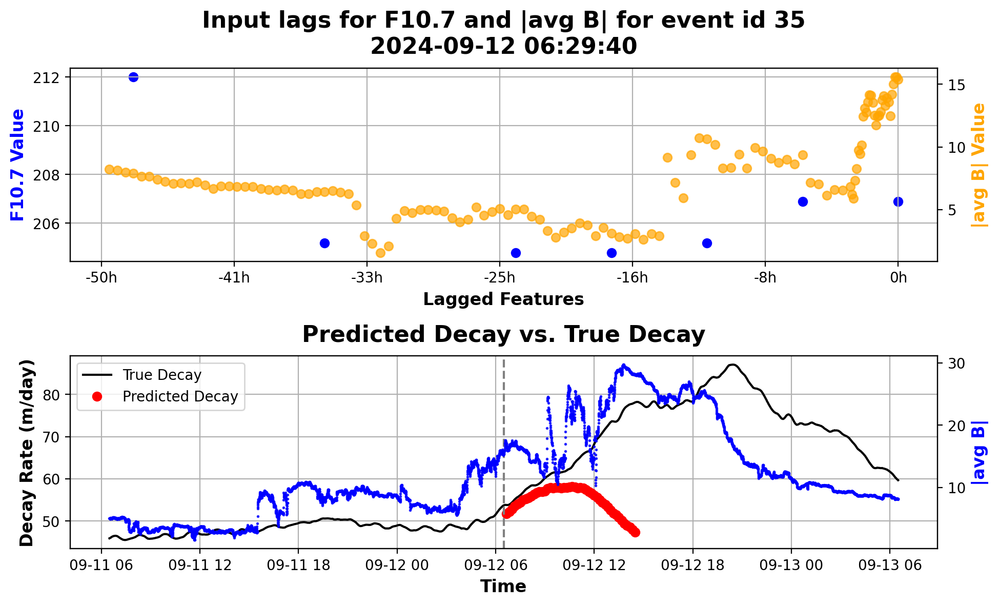

In [221]:
event_id = 35
event_peak_time = event_peak_times[event_ids.tolist().index(event_id)]
plot_forecast_for_event(event_id, event_peak_time, time_delta_hours=7)

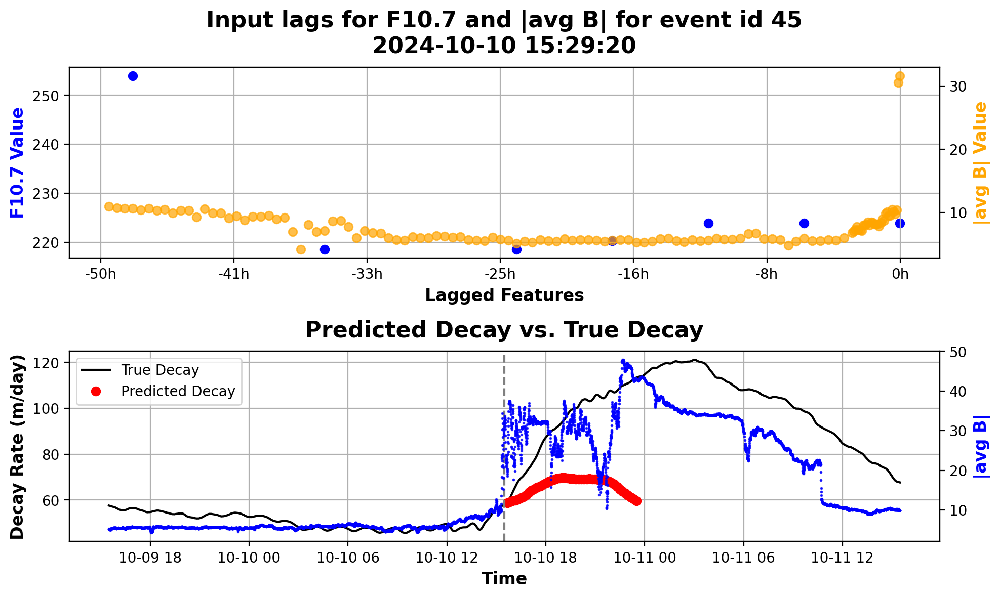

In [222]:
event_id = 45
event_peak_time = event_peak_times[event_ids.tolist().index(event_id)]
plot_forecast_for_event(event_id, event_peak_time, time_delta_hours=11.5)

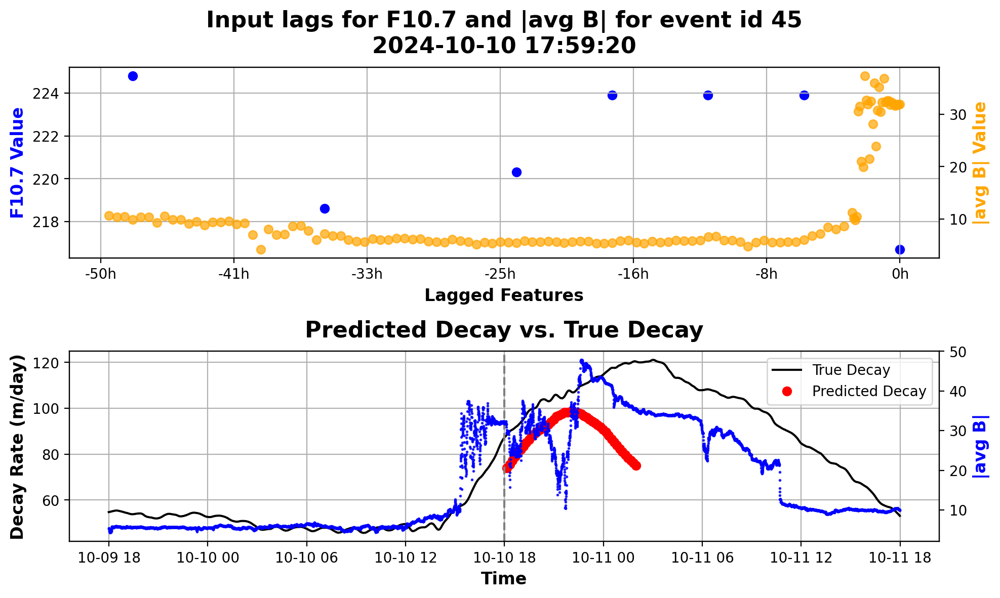

In [223]:
event_id = 45
event_peak_time = event_peak_times[event_ids.tolist().index(event_id)]
plot_forecast_for_event(event_id, event_peak_time, time_delta_hours=9)

## 4.2 Predict on full test dataset instead of just during events 
(but still keep model that was trained solely during events).

In [120]:
y_raw_test = y_raw.loc[y_test.index[0]:]
X_raw_test = X_raw.loc[y_test.index[0]:]

y_raw_pred = pd.DataFrame(model_trend.predict(scaler.transform(X_raw_test)), index=X_raw_test.index, columns=y_raw_test.columns)

In [123]:
bmin, bmax, bmean, sem = compute_prediction_bands(y_raw_test, y_raw_pred)

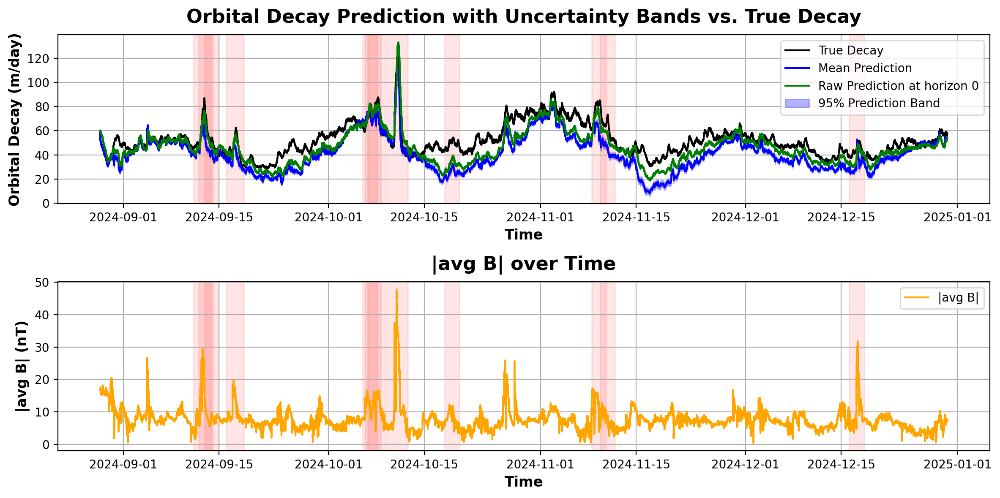

In [138]:
mr = y_raw_test.shape[0]
time_index = y_raw_test.index

fig, axs = plt.subplots(figsize=(12,6), nrows=2, ncols=1)

axs[0].plot(time_index, y_raw_test.iloc[:, 0], label='True Decay', color='black')
axs[0].plot(time_index, bmean, label='Mean Prediction', color='blue')
axs[0].plot(time_index, y_raw_pred.iloc[:, 0], label='Raw Prediction at horizon 0', color='green')
axs[0].fill_between(time_index, bmean - 1.96 * sem, bmean + 1.96 * sem, color='blue', alpha=0.3, label='95% Prediction Band')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Orbital Decay (m/day)')
axs[0].set_title('Orbital Decay Prediction with Uncertainty Bands vs. True Decay')
axs[0].grid(True)

# plot |avg B| on ax[1]
b_values = subset.loc[time_index, '|avg B|']
axs[1].plot(time_index, b_values, label='|avg B|', color='orange')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('|avg B| (nT)')
axs[1].set_title('|avg B| over Time')
axs[1].grid(True)

test_subset = subset.loc[y_raw_test.index]
# vspan events
event_ids = test_subset['unique_event_id'].dropna().unique()
for event_id in event_ids:
    event_data = test_subset[test_subset['unique_event_id'] == event_id]
    start_time = event_data.index[0]
    end_time = event_data.index[-1]
    axs[0].axvspan(start_time - pd.Timedelta(hours=24), end_time + pd.Timedelta(hours=24), color='red', alpha=0.1)
    axs[1].axvspan(start_time - pd.Timedelta(hours=24), end_time + pd.Timedelta(hours=24), color='red', alpha=0.1)

axs[0].legend()
axs[1].legend()

plt.tight_layout()
plt.show()

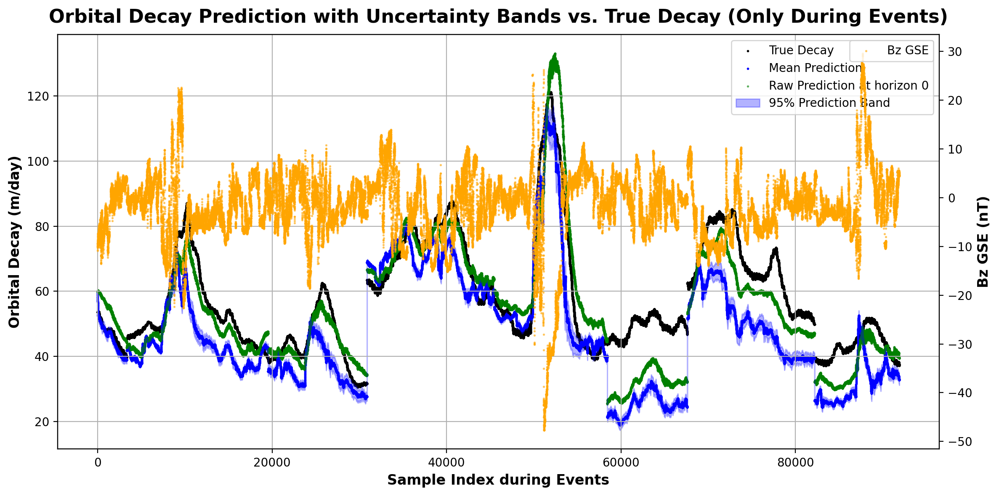

In [147]:
trange = range(len(y_test))
fig, axs = plt.subplots(figsize=(12,6), nrows=1, ncols=1)
mask = y_raw_test.index.isin(event_subset.index)

ax2 = axs.twinx()
b_values = subset.loc[y_raw_test.index[mask], 'Bz GSE']
ax2.scatter(trange, b_values, label='Bz GSE', color='orange', alpha=0.5, s=1)
ax2.set_ylabel('Bz GSE (nT)')
ax2.legend(loc='upper right')

axs.scatter(trange, y_test.iloc[:, 0], label='True Decay', color='black', s=1)
axs.scatter(trange, bmean[mask], label='Mean Prediction', color='blue', s=1)
axs.scatter(trange, y_raw_pred[mask].iloc[:, 0], label='Raw Prediction at horizon 0', color='green', alpha=0.5, s=1)

axs.fill_between(trange, bmean[mask] - 1.96 * sem[mask], bmean[mask] + 1.96 * sem[mask], color='blue', alpha=0.3, label='95% Prediction Band')
axs.set_xlabel('Sample Index during Events')
axs.set_ylabel('Orbital Decay (m/day)')
axs.set_title('Orbital Decay Prediction with Uncertainty Bands vs. True Decay (Only During Events)')
axs.grid(True)
axs.legend()


plt.tight_layout()
plt.show()


## 4.3 Each test storm against B or Bz

In [186]:
def plot_storms(axs, col_to_plot):
    fig, axs = plt.subplots(nrows=len(event_ids), ncols=1, figsize=(12, 4 * len(event_ids)))
    axs = axs.flatten()

    for i, event_id in enumerate(event_ids):
        event_data = test_subset[test_subset['unique_event_id'] == event_id]
        start_time = event_data.index[0] - pd.Timedelta(hours=24)
        end_time = event_data.index[-1] + pd.Timedelta(hours=24)
        event_range = (y_raw_test.index >= start_time) & (y_raw_test.index <= end_time)
        axs[i].plot(y_raw_test.index[event_range], y_raw_test.iloc[event_range, 0], label='True Decay', color='black')
        axs[i].plot(y_raw_test.index[event_range], bmean[event_range], label='Mean Prediction', color='blue')
        axs[i].plot(y_raw_test.index[event_range], y_raw_pred.iloc[event_range, 0], label='Raw Prediction at horizon 0', color='green')
        axs[i].fill_between(y_raw_test.index[event_range], bmean[event_range] - 1.96 * sem[event_range], bmean[event_range] + 1.96 * sem[event_range], color='blue', alpha=0.3, label='95% Prediction Band')
        axs[i].set_xlabel('Time')
        axs[i].set_ylabel('Orbital Decay (m/day)')
        axs[i].set_title(f'Orbital Decay Prediction with Uncertainty Bands vs. True Decay for Event {event_id}\nfrom {start_time} to {end_time}\nEvent class: {event_data["activity_level"].iloc[0]}')
        axs[i].grid(True)   
        axs[i].axvspan(event_data.index[0], event_data.index[-1], color='red', alpha=0.1)
        axs[i].legend()
        bz_window = subset.loc[start_time:end_time, col_to_plot]
        axs2 = axs[i].twinx()
        axs2.plot(bz_window.index, bz_window.values, color='orange', alpha=0.8)
        axs2.set_ylabel(col_to_plot, color='orange')
        axs2.legend([col_to_plot], loc='upper right')

        axs[i].set_ylim(0, 130)
        
        if col_to_plot == '|avg B|':
            axs2.set_ylim(0, 40) 
        elif col_to_plot == 'Bz GSE':
            axs2.set_ylim(-40, 30)
        elif col_to_plot == 'Kp (LASP)':
            axs2.set_ylim(0, 9)

    plt.tight_layout()
    plt.show()

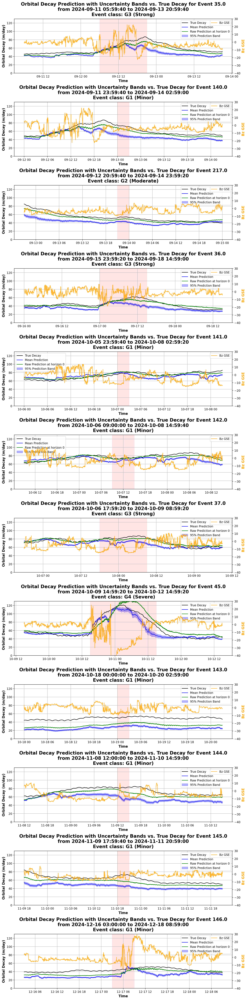

In [187]:
plot_storms(axs, 'Bz GSE')

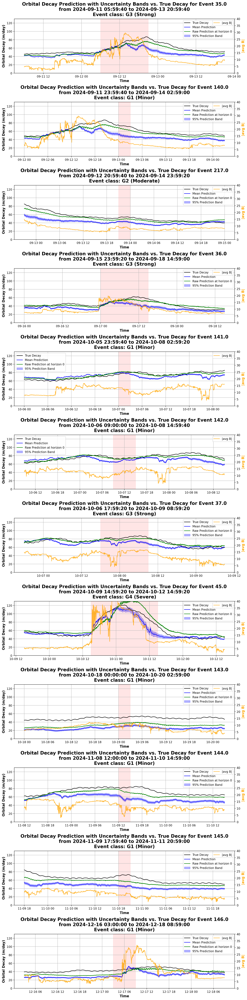

In [188]:
plot_storms(axs, '|avg B|')

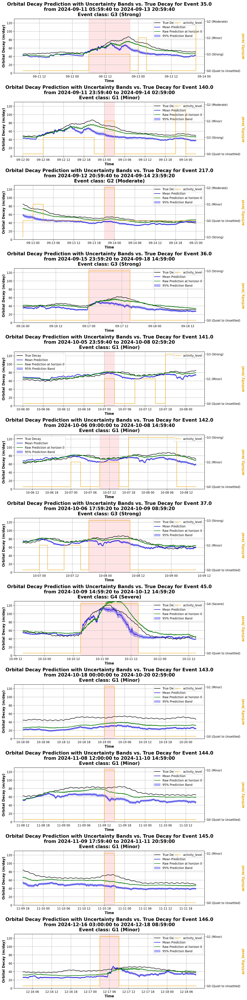

In [189]:
plot_storms(axs, 'activity_level')

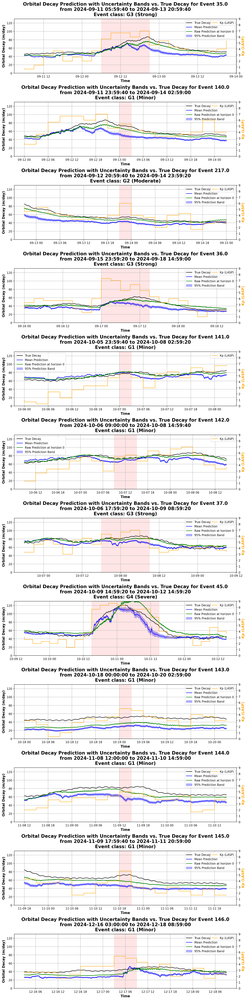

In [190]:
plot_storms(axs, 'Kp (LASP)')

# 5. Evaluate

(-0.5, 1.0)

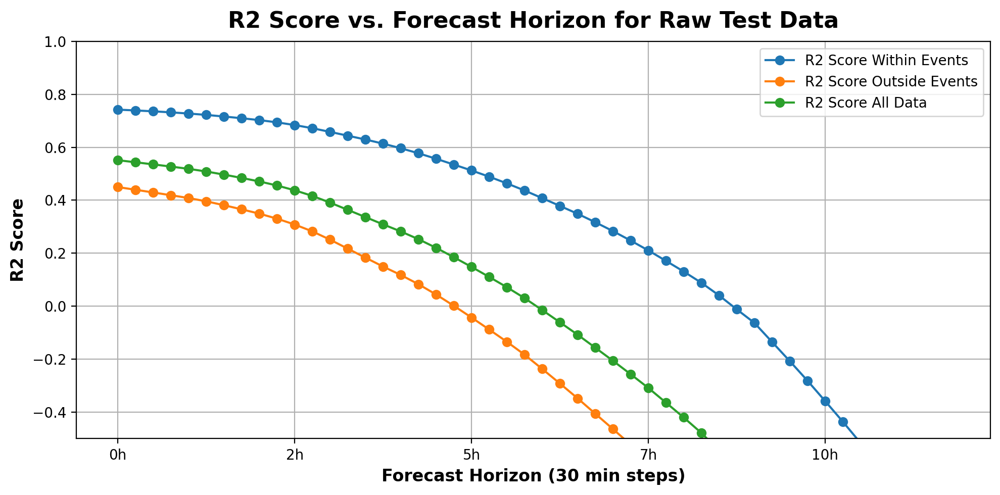

In [191]:
horizon_r2_list = []
horizon_r2_off_list = []
horizon_r2_all = []
for horizon in range(y_raw_test.shape[1]):
    horizon_r2 = r2_score(y_raw_test[mask].iloc[:, horizon], y_raw_pred[mask].iloc[:, horizon])
    horizon_r2_off = r2_score(y_raw_test[~mask].iloc[:, horizon], y_raw_pred[~mask].iloc[:, horizon])
    horizon_r2_all.append(r2_score(y_raw_test.iloc[:, horizon], y_raw_pred.iloc[:, horizon]))
    horizon_r2_list.append(horizon_r2)  
    horizon_r2_off_list.append(horizon_r2_off)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(range(len(horizon_r2_list)), horizon_r2_list, marker='o')
ax.plot(range(len(horizon_r2_off_list)), horizon_r2_off_list, marker='o')
ax.plot(range(len(horizon_r2_all)), horizon_r2_all, marker='o')

# change x ticks to be in hours
xticks = ax.get_xticks()
xtick_labels = [f'{int(tick * target_step / 60)}h' for tick in xticks]
ax.set_xticklabels(xtick_labels)
ax.legend(['R2 Score Within Events', 'R2 Score Outside Events', 'R2 Score All Data'])
ax.set_xlabel('Forecast Horizon (30 min steps)')
ax.set_ylabel('R2 Score')
ax.set_title('R2 Score vs. Forecast Horizon for Raw Test Data')
ax.grid(True)

ax.set_ylim([-0.5, 1.0])

# 6. Other plots

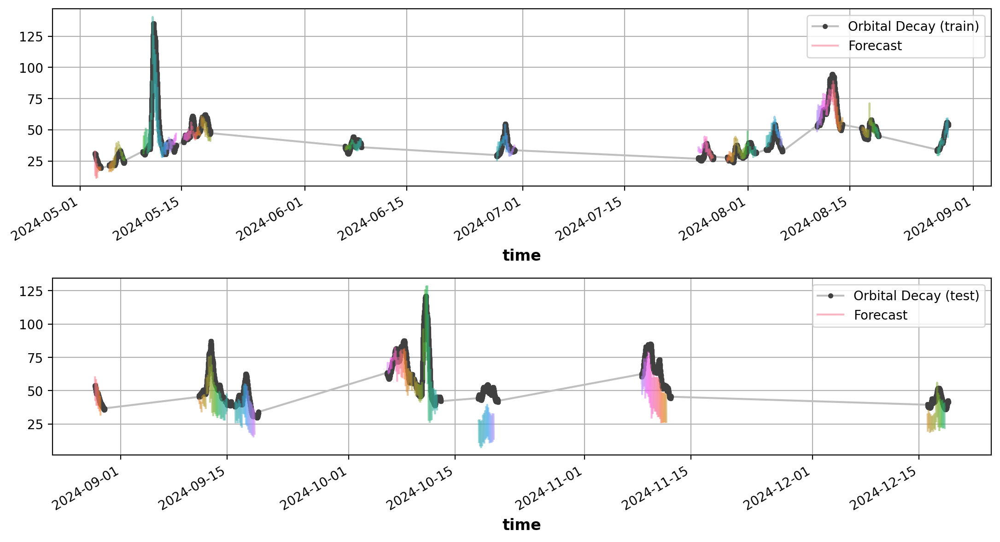

In [192]:
plot_results(y_train, y_fit, y_test, y_pred)